# 1. Loading dataset


In [ ]:
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
from tqdm import tqdm
import plotly.express as px
from sklearn.cluster import KMeans
from matplotlib import pyplot as plt
from sklearn.metrics import silhouette_score
from sklearn.decomposition import TruncatedSVD
from sklearn.feature_extraction.text import TfidfVectorizer
np.random.seed(42)

In [ ]:
data = pd.read_excel("news.xlsx")

# 2. Data preprocessing
#### Here we extract features from the news articles using tf-idf representation techniques.

In [ ]:
x = data["News_Article"]
y = data["Category"]

In [ ]:
tfidf = TfidfVectorizer(max_features=3000)
data_tf = tfidf.fit_transform(x)

# 3. PCA
#### Applying PCA on the prepared data with 3 components.

In [ ]:
pca = TruncatedSVD(n_components=3)
data_tf_pca = pca.fit_transform(data_tf)

# 4. Visualization
#### Visualizing the data in 3D.

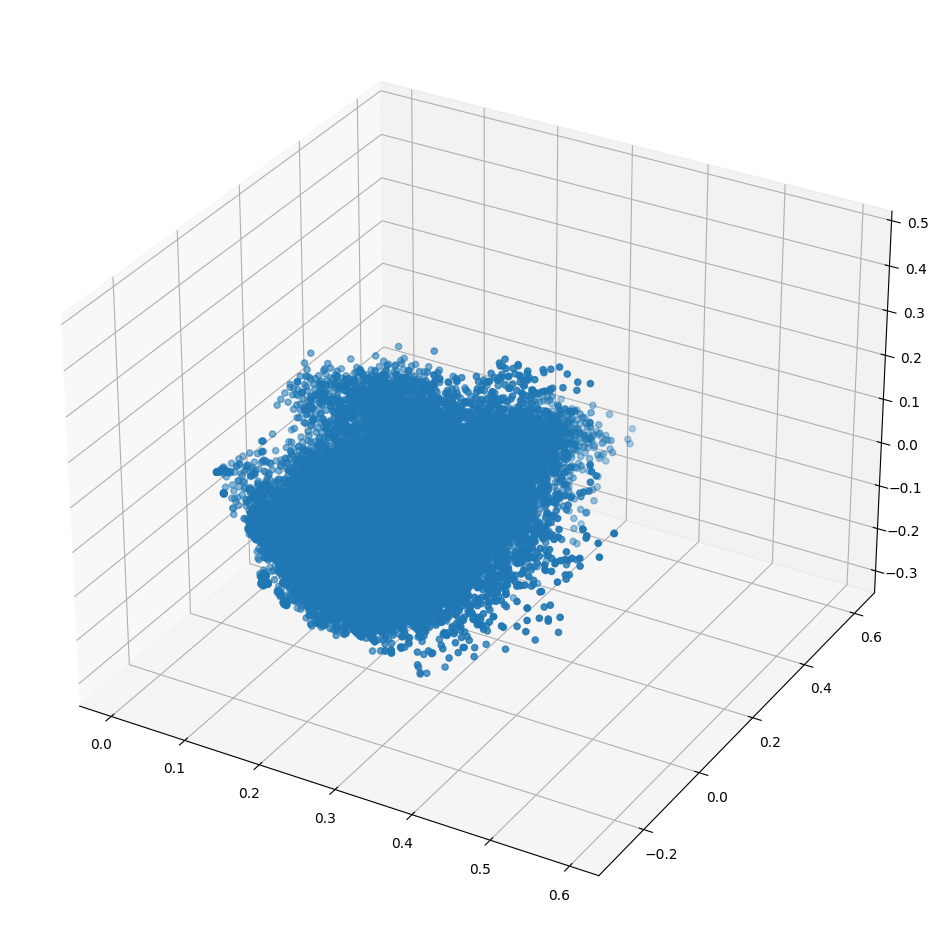

In [ ]:
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(projection='3d')
ax.scatter(data_tf_pca[:, 0], data_tf_pca[:, 1], data_tf_pca[:, 2])
plt.show()

# 5. Clustering
#### Apply Kmeans clustering on the data.

In [ ]:
kmeans = KMeans(n_clusters=6).fit(data_tf_pca)
kmeans.labels_

array([0, 3, 0, ..., 1, 5, 1])

In [ ]:
kmeans.inertia_

385.21063536905274

# 6. Visualization
#### Visualizing the data in 3D with cluster as color.

In [ ]:
fig = px.scatter_3d(x=data_tf_pca[:,0], y=data_tf_pca[:,1], z=data_tf_pca[:,2], color=kmeans.labels_)
fig.update_traces(marker_size=3)
fig.show()

In [ ]:
silhouette_score(data_tf_pca, kmeans.labels_)

0.2708981729492383

In [ ]:
elbow = []
silhouette = []
for k in tqdm(range(2, 11)):
    kmeans = KMeans(n_clusters=k).fit(data_tf_pca)
    elbow.append(kmeans.inertia_)
    silhouette.append(silhouette_score(data_tf_pca, kmeans.labels_))

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [06:26<00:00, 42.93s/it]


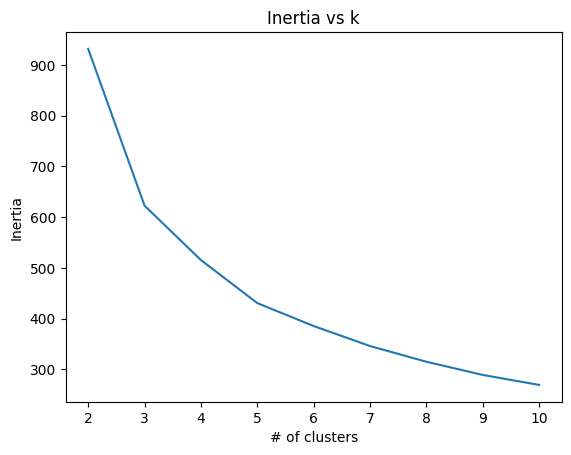

In [ ]:
plt.plot(range(2, 11), elbow)
plt.xlabel("# of clusters")
plt.ylabel("Inertia")
plt.title("Inertia vs k")
plt.show()

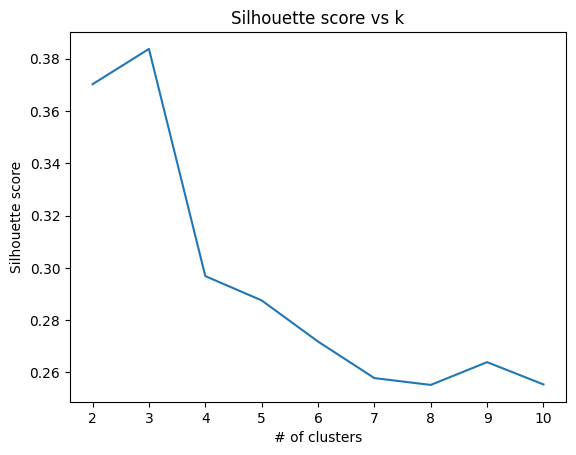

In [ ]:
plt.plot(range(2, 11), silhouette)
plt.xlabel("# of clusters")
plt.ylabel("Silhouette score")
plt.title("Silhouette score vs k")
plt.show()